# Homework 2

For this assignment, you will be developing an artificial neural network to classify data given in the __[Dry Beans Data Set](https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset#)__. This data set was obtained as a part of a research study by Selcuk University, Turkey, in which a computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features. More details on the study can be found in the following __[research paper](https://www.sciencedirect.com/science/article/pii/S0168169919311573)__.

## About the Data Set For Q1
Seven different types of dry beans were used in a study in Selcuk University, Turkey, taking into account the features such as form, shape, type, and structure by the market situation. A computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features in order to obtain uniform seed classification. For the classification model, images of 13611 grains of 7 different registered dry beans were taken with a high-resolution camera. Bean images obtained by computer vision system were subjected to segmentation and feature extraction stages, and a total of 16 features - 12 dimensions and 4 shape forms - were obtained from the grains.

Number of Instances (records in the data set): __13611__

Number of Attributes (fields within each record, including the class): __17__

### Data Set Attribute Information:

1. __Area (A)__ : The area of a bean zone and the number of pixels within its boundaries.
2. __Perimeter (P)__ : Bean circumference is defined as the length of its border.
3. __Major axis length (L)__ : The distance between the ends of the longest line that can be drawn from a bean.
4. __Minor axis length (l)__ : The longest line that can be drawn from the bean while standing perpendicular to the main axis.
5. __Aspect ratio (K)__ : Defines the relationship between L and l.
6. __Eccentricity (Ec)__ : Eccentricity of the ellipse having the same moments as the region.
7. __Convex area (C)__ : Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
8. __Equivalent diameter (Ed)__ : The diameter of a circle having the same area as a bean seed area.
9. __Extent (Ex)__ : The ratio of the pixels in the bounding box to the bean area.
10. __Solidity (S)__ : Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
11. __Roundness (R)__ : Calculated with the following formula: (4piA)/(P^2)
12. __Compactness (CO)__ : Measures the roundness of an object: Ed/L
13. __ShapeFactor1 (SF1)__
14. __ShapeFactor2 (SF2)__
15. __ShapeFactor3 (SF3)__
16. __ShapeFactor4 (SF4)__

17. __Classes : *Seker, Barbunya, Bombay, Cali, Dermosan, Horoz, Sira*__

### Libraries that can be used :
- NumPy, SciPy, Pandas, Sci-Kit Learn, TensorFlow, Keras
- Any other library used during the lectures and discussion sessions.

## About the Data Set For Q3
In this problem, we will be exploring the car dataset and analyzing their fuel efficiency. <br >
Specifically, we will do some exploratory analysis with visualizations, then we will build a model for Simple Linear Regression, a model for Polynomial Regression, and one model for Logistic Regression. <br >
**The given dataset is already modified and cleaned**, but you can find [the original information here.](https://archive.ics.uci.edu/ml/datasets/auto+mpg).

## Dataset Attribute Information

1. **mpg**: Miles per gallon. This is one primary measurement for car fuel efficiency.
2. **displacement** : The cylinder volumes in cubic inches.
3. **horsepower** : Engine power.
4. **weight** : In pounds.
5. **acceleration** : The elapsed time in seconds to go from 0 to 60mph.
6. **origin** : Region of origin.

### Libraries that can be used: numpy, pandas, scikit-learn, seaborn, plotly, matplotlib
Any libraries used in the discussion materials are also allowed.


### Other Notes
- Don't worry about not being able to achieve high accuracy, it is neither the goal nor the grading standard of this assignment.
- Discussion materials should be helpful for doing the assignments.
- The homework submission should be a .ipynb file.


## Exercise 1 : Data Understanding (23 points in total)
* As the classes are categorical, use one-hot encoding to represent the set of classes. 
* Normalize each field of the input data using the min-max normalization technique.
* Plot the distribution of data and analyze the distribution. Explain if the data is symmetric, or sekewed to right or left. 
* Plot the target (class) variable and show if data has linear or non-linear behavior. Suggest whether a linear or non-linear model should be developed for the data. 
    * hints: After normalizing the input variables, for each pair of input variables (xi, xj), create a 2D pair-plot between the variables, and color-code the target variable according to the label of the target variable (for example you can use red for y="sira"). Then analyze the relationship between the input variables and the target variable to see if you can find a linear no non-linear line to separate the data points according to the target variable class. For each combination of input variables, create a separate pair plot. Pair plot has been discussed in the HW1 discussion. 

In [3]:
import sys
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

np.set_printoptions(threshold=sys.maxsize)

dataset = pd.read_csv("Dry_Beans_Dataset.csv")

X = dataset.drop('Class', axis = 1)
y = dataset['Class']

print(X)
print(y)

         Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0       44830    814.955       320.731947       178.405838      1.797766   
1       33476    691.826       258.837971       165.220760      1.566619   
2       27057    606.138       227.460904       151.860320      1.497830   
3       49483    844.283       326.602913       194.689529      1.677558   
4       22461    544.584       192.801303       148.541136      1.297966   
...       ...        ...              ...              ...           ...   
13606   39956    745.166       273.867402       186.564001      1.467954   
13607  171914   1595.676       598.541646       368.358372      1.624889   
13608   48266    817.340       304.682706       202.282198      1.506226   
13609   43279    843.066       336.280446       164.667135      2.042183   
13610   46856    809.173       302.595376       197.920303      1.528875   

       Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0     

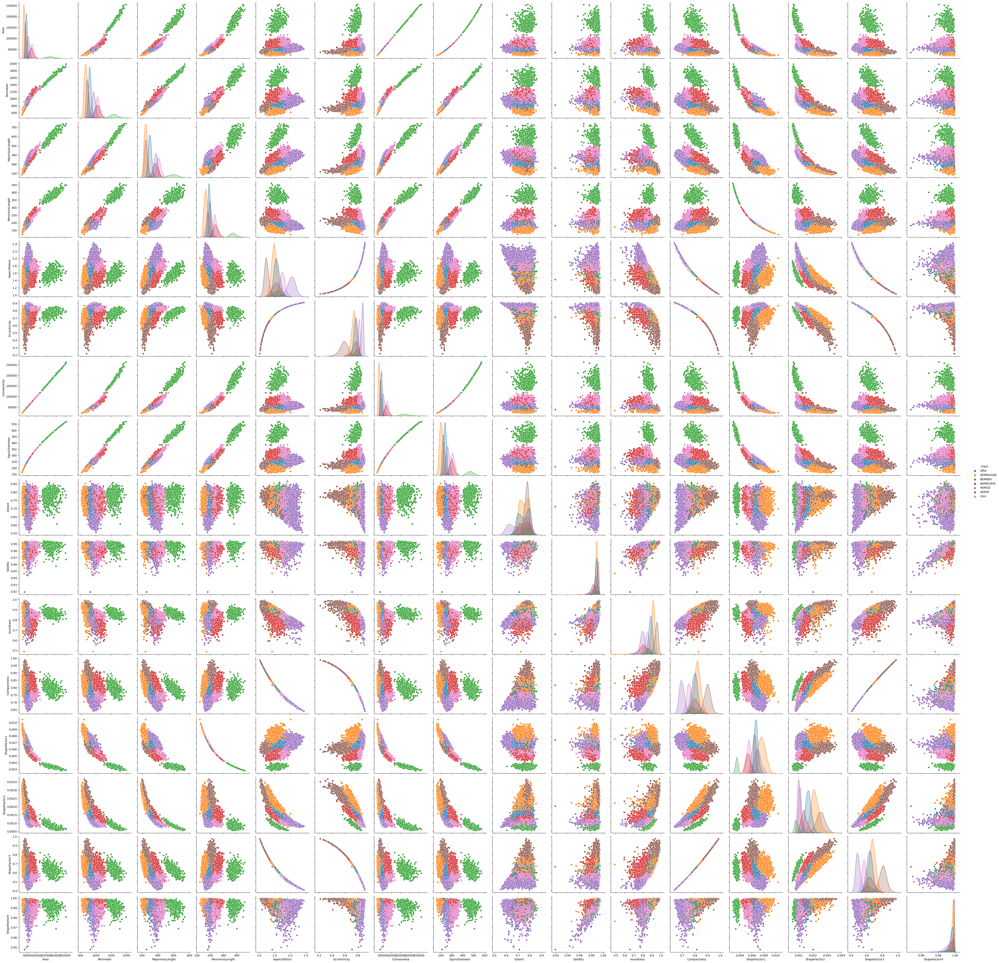

In [5]:
sns_plot = sns.pairplot(dataset, hue = "Class", height = 3)

In [39]:
set_of_classes = y.value_counts().index.tolist()
set_of_classes= pd.DataFrame({'Class': set_of_classes})
y_dum = pd.get_dummies(y,dtype=int)

oec = OneHotEncoder()
y_onehot = oec.fit(np.asarray(y).reshape(-1, 1))
y_onehot = oec.transform(np.asarray(y).reshape(-1, 1)).toarray()

print("Pre-processed class :")
print(y)
print(y_onehot)


Pre-processed class :
0            SIRA
1        DERMASON
2        DERMASON
3            SIRA
4        DERMASON
           ...   
13606    DERMASON
13607      BOMBAY
13608        SIRA
13609       HOROZ
13610        SIRA
Name: Class, Length: 13611, dtype: object
[[0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0

In [40]:
scaler = MinMaxScaler(feature_range=(0, 1))
X_rescaled = scaler.fit_transform(X)
X_rescaled = pd.DataFrame(data = X_rescaled, columns = X.columns)
print(X_rescaled)

           Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0      0.104229   0.198694         0.246967         0.165518      0.549934   
1      0.055748   0.114396         0.135499         0.126473      0.385468   
2      0.028340   0.055731         0.078990         0.086908      0.336523   
3      0.124097   0.218773         0.257541         0.213740      0.464403   
4      0.008715   0.013589         0.016569         0.077079      0.194315   
...         ...        ...              ...              ...           ...   
13606  0.083417   0.150914         0.162566         0.189677      0.315266   
13607  0.646868   0.733202         0.747292         0.728031      0.426928   
13608  0.118900   0.200327         0.218063         0.236224      0.342497   
13609  0.097606   0.217940         0.274969         0.124833      0.723842   
13610  0.112880   0.194735         0.214304         0.223307      0.358612   

       Eccentricity  ConvexArea  EquivDiameter    Extent  Solid

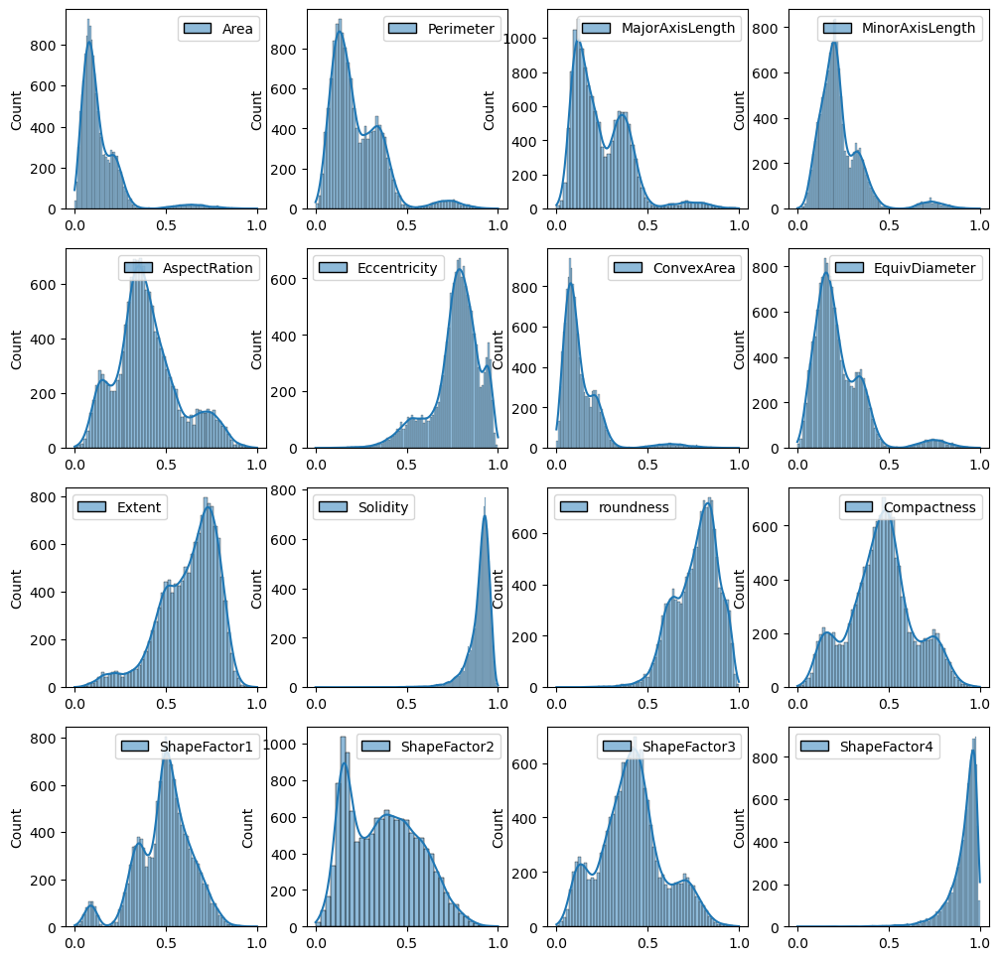

In [9]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
axes = axes.flatten()

# Loop to create subplots
i = 0
for item in X_rescaled.items():
    sns.histplot(item, kde=True, ax=axes[i])
    i+=1

plt.show()

## Exercise 2 - Logistic Regression (20 points in total)
Recall the dataset from last week homework

Now we are going to build a classification model on ``origin`` using all the other 5 attributes. <br >
Note that Logistic Regression is a binary classificaiton algorithm.

### Exercise 2.1 - Processing and Splitting the Dataset (5 points)
In this exercise 3, we only consider those observations where they originate from either "USA" or "Japan". <br >
So please **remove** those observations that originate from "Europe". <br >
And then, split the data into training and testing set with the ratio of 80:20. <br >

In [18]:
df = pd.read_csv('auto-mpg.csv') 
print(df)

      mpg  displacement  horsepower  weight  acceleration  origin
0    18.0         307.0       130.0  3504.0          12.0     USA
1    15.0         350.0       165.0  3693.0          11.5     USA
2    18.0         318.0       150.0  3436.0          11.0     USA
3    16.0         304.0       150.0  3433.0          12.0     USA
4    17.0         302.0       140.0  3449.0          10.5     USA
..    ...           ...         ...     ...           ...     ...
387  27.0         140.0        86.0  2790.0          15.6     USA
388  44.0          97.0        52.0  2130.0          24.6  Europe
389  32.0         135.0        84.0  2295.0          11.6     USA
390  28.0         120.0        79.0  2625.0          18.6     USA
391  31.0         119.0        82.0  2720.0          19.4     USA

[392 rows x 6 columns]


In [23]:
# remove those observations that originate from "Europe".
data = df.copy().loc[(df["origin"] != 'Europe'), :]

train, test = train_test_split(data, test_size=0.2, random_state=21)
# The remaining
X_train, y_train = train.drop(columns=[ "origin"]), train["origin"]
X_test, y_test = test.drop(columns=[ "origin"]), test["origin"]
print("Training Set")
print(train)
print("Test Set")
print(test)

Training Set
      mpg  displacement  horsepower  weight  acceleration origin
138  14.0         304.0       150.0  4257.0          15.5    USA
56   24.0         113.0        95.0  2278.0          15.5  Japan
163  20.0         262.0       110.0  3221.0          13.5    USA
374  36.0         120.0        88.0  2160.0          14.5  Japan
70   19.0          70.0        97.0  2330.0          13.5  Japan
..    ...           ...         ...     ...           ...    ...
144  28.0          90.0        75.0  2125.0          14.5    USA
57   25.0          97.5        80.0  2126.0          17.0    USA
317  31.3         120.0        75.0  2542.0          17.5  Japan
379  38.0          91.0        67.0  1995.0          16.2  Japan
253  25.1         140.0        88.0  2720.0          15.4    USA

[259 rows x 6 columns]
Test Set
      mpg  displacement  horsepower  weight  acceleration origin
268  21.1         134.0        95.0  2515.0          14.8  Japan
123  11.0         350.0       180.0  3664.0 

### Exercise 2.2 - Logistic Regression (15 points)

Using all the other 5 attributes, please build a Logistic Regression model that distinguishes between cars from Japan and cars from the USA. <br >
Then, **if we are distinguishing between Japan and Europe this time, how do you think the model performance(in terms of accuracy) will change? Provide your reasoning.** (Hint: Exercise 1)

Requirements
 - Report the testing precision and recall for both regions.

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

cls = LogisticRegression()
cls.fit(X_train, y_train)
print(classification_report(y_test, cls.predict(X_test)))


              precision    recall  f1-score   support

       Japan       0.81      0.62      0.70        21
         USA       0.84      0.93      0.88        44

    accuracy                           0.83        65
   macro avg       0.82      0.78      0.79        65
weighted avg       0.83      0.83      0.82        65



## Exercise 3 - Polynomial Regressor using Gradient Descent (20 points in total)
Now we are going to look into model fitting. In the dataset cost.csv, the first column is the independent variable production_output, and the second column is the dependent variable cost.

### Exercise 3.1 - Split the dataset (5 points)
Import the dataset cost.csv and split them into training and testing set with ratio 70:30.

In [6]:
df = pd.read_csv('cost.csv') 
print(df)

     production_output         cost
0             0.588758    -4.301000
1             1.679874    89.065547
2             1.217010    11.554992
3             0.207285    -8.976411
4             0.505954    -4.851820
..                 ...          ...
145           1.244416    23.059364
146           2.730258   780.518570
147           1.106387    11.257158
148           3.052726  1309.721659
149           2.369268   405.456450

[150 rows x 2 columns]


In [7]:
data = df.copy()
train, test = train_test_split(data, test_size=0.3, random_state=21)
print("Training Set")
print(train)
print("Test Set")
print(test)

Training Set
     production_output         cost
36            1.015767    -1.320746
37            1.038096     5.370536
13            1.902660   145.618826
68            2.725839   785.473350
11            0.836581     8.681586
..                 ...          ...
120           1.698860    86.939174
112           2.688981   723.713419
48            3.291118  1874.099240
4             0.505954    -4.851820
56            1.946786   161.537932

[105 rows x 2 columns]
Test Set
     production_output         cost
92            1.833380   121.269810
44            2.407722   437.563890
7             2.121086   235.866071
21            1.477105    44.567279
95            1.434741    28.740909
75            2.547848   565.968980
20            4.042392  4893.135440
121           2.879521   985.351193
26            1.963393   164.201939
19            2.683277   721.141738
81            1.279339    17.824193
88            2.856602   964.861336
143           1.491975    39.873621
117           2.12

### Exercise 3.2 - Polynomial Regression (15 points)
Compute the RMSE and R2 for the training and testing set. Using polynomial regression with degree 1, 2, 3, and 4, which model provides the most appropriate prediction? Justify your answer and plot the models fitted line.

In [8]:
import operator
X_train, y_train = train.drop(columns=['cost']), train['cost']
X_test, y_test = test.drop(columns=['cost']), test['cost']
X_train, X_test = X_train['production_output'], X_test['production_output']

In [17]:
def Polynomial (deg,x):
    poly = PolynomialFeatures(degree=deg, include_bias=False)
    X_poly = poly.fit_transform(np.asarray(X_train).reshape(-1, 1))
    plr = LinearRegression()
    
    plr.fit(X_poly, np.asarray(y_train).reshape(-1, 1))
   
    predicted = plr.predict(poly.transform(np.asarray(X_test).reshape(-1, 1)))
    mse = mean_squared_error(y_test,predicted)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test,predicted)
    print('Test RMSE: %8.15f' % rmse)
    print('Test R2: %8.15f' % r2)
    
    
    predicted_train = plr.predict(poly.transform(np.asarray(X_train).reshape(-1, 1)))
    Train_mse = mean_squared_error(y_train,predicted_train)
    Train_rmse = np.sqrt(Train_mse)
    Train_r2 = r2_score(y_train,predicted_train)
    print('Train_RMSE: %8.15f' %  Train_rmse)
    print('Train_R2: %8.15f' % Train_r2)
    
    plt.figure(figsize =(10,6))
    plt.scatter(X_train,y_train)
    
    # sort data of X_test, predicted
    # sort the values of x before line plot
    sort_axis = operator.itemgetter(0)
    sorted_zip = sorted(zip(x,predicted), key=sort_axis)
    x, predicted= zip(*sorted_zip)
    plt.plot(x, predicted, color='red')
    plt.show()

Degree = 1: 
Test RMSE: 572.965111937086363
Test R2: 0.515680036166109
Train_RMSE: 301.847579681022978
Train_R2: 0.660108476969875


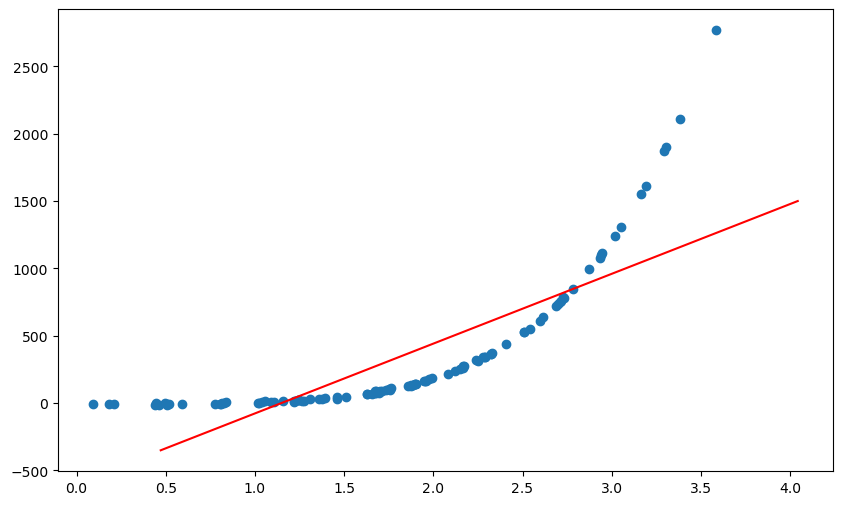

In [18]:
print( 'Degree = 1: ')
Polynomial(1,X_test)

Degree = 2: 
Test RMSE: 277.149595628091674
Test R2: 0.886680535671964
Train_RMSE: 108.075321730246557
Train_R2: 0.956426944862927


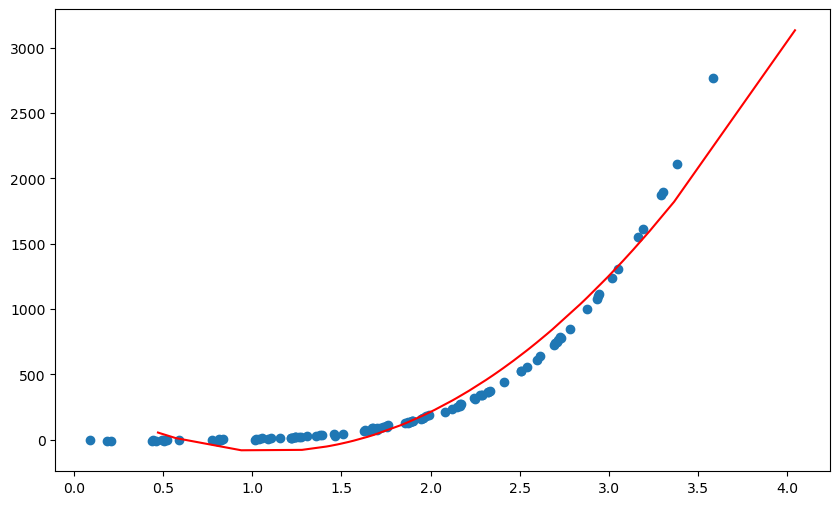

In [19]:
print( 'Degree = 2: ')
Polynomial(2,X_test)

Degree = 3: 
Test RMSE: 82.506221451857499
Test R2: 0.989957324947261
Train_RMSE: 21.823482434675856
Train_R2: 0.998223304328393


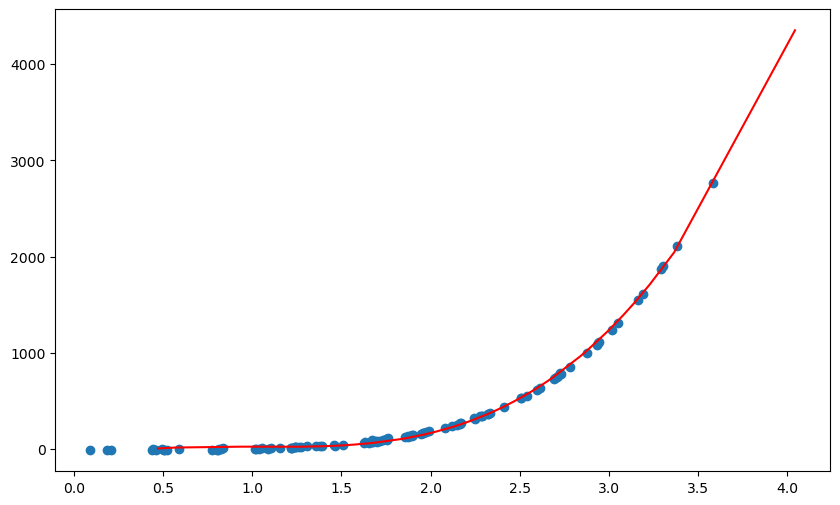

In [20]:
print( 'Degree = 3: ')
Polynomial(3,X_test)

Degree = 4: 
Test RMSE: 14.996777658729632
Test R2: 0.999668203408898
Train_RMSE: 4.729745281561527
Train_R2: 0.999916547290287


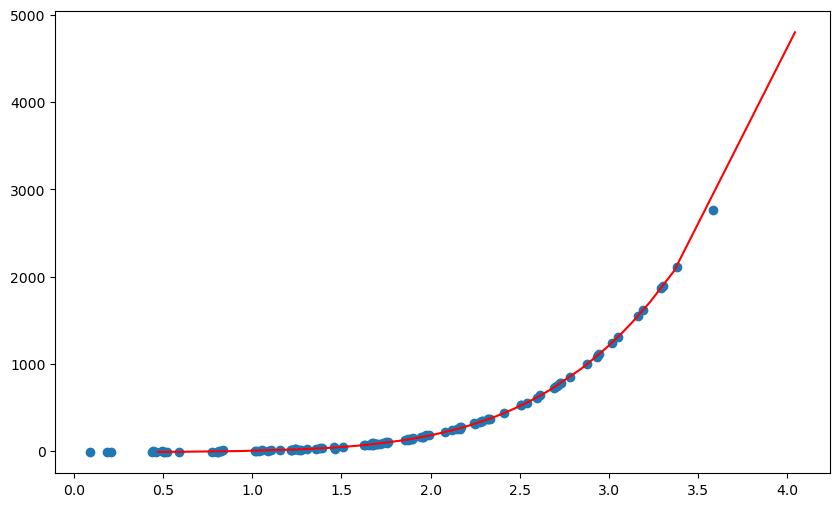

In [21]:
print( 'Degree = 4: ')
Polynomial(4,X_test)

Based on the RMSE and R2 values, it's evident that the polynomial regression model with degree 4 is the most appropriate for predicting the data. It has the lowest RMSE and the highest R2, indicating the best overall performance. 

## Exercise 4 : Log Likelihood (27 points in total)
For a model with two independent variables x1 (Weight) and x2 (Length), compute the log-likelihood for the model: ŷ = 0.1 x1 + 0.1 x2 , where the dependent variable ŷ represents the prediction for Height. Given the dataset below (in the table), assuming that the measurements have normal distribution, please complete the table. 

Round your answer to 4 d.p. For simplicity, use and log base 10.

Hint: $f(y_i)=\frac{1}{\sqrt{2\piσ^2}}e^{\frac{-(y_i-ŷ_i)^2}{2σ^2}}$

Model 1: 
Weight x1 | Length x2 | Actual Height y | Predicted Height ŷ | squared residual (y - ŷ )^2 | Log-Likelihood
---|---|---|---|---|---|
7.0 | 50 | 5.80
6.0 | 55 | 5.70
8.0 | 56 | 6.00